In [1]:
import tensorflow as tf

import numpy as np
from scipy import spatial
import cv2 as cv
import scipy.io as sio
import sys

sys.path.append('..')

from extractEmbeddings import featureExtractor

%matplotlib inline
import matplotlib.pyplot as plt

/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3

setGPU: Setting GPU to: 1


In [2]:
""" 30 titles custom model"""
def loadCustomModels(width, height, channels, nClasses, layerName, modelPath, isWeights, modelType):
    featExtract = featureExtractor(nClasses, modelType)
    
    if isWeights:
        model = featExtract.inferenceOwnModel()
        model.load_weights(modelPath)
    else:
        model = tf.keras.models.load_model(modelPath)
        
    interModel = tf.keras.Model(inputs=model.input, outputs=model.get_layer(layerName).output)
    
    return featExtract, interModel

In [3]:
"""
Testing with differen models
"""
modelPathMT = '../../../model/041119/final_model.h5'
modelPathMini = '../../../model/181119_mini/final_model.h5'
modelPathFranciosExp = '../../ownlearnings/cv_keras_exp_Francios_book/model/021019/final_model.h5'
modelPathAE = '../../AE/model/100419/cnn_ae_100419_VGG16_dn.h5'

width=height = 299
channels = 3
nClasses = 29
layerName ='dense2' #'pre-predictions', 'encoder'
isWeights = False
modelType = 'InceptionV3'

featExtract, interModel = loadCustomModels(width, height, channels, nClasses, layerName, modelPathMini, isWeights, modelType)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [6]:
imgSize = interModel.input_shape[1]
print(imgSize)

299


In [9]:
dst_path = '../../data/movie_titles/all_titles_uncompressed/5454/'
featureVectors, fileNames = featExtract.extractFeatures(dst_path, interModel)

In [6]:
data = sio.loadmat('../../data/movie_titles/all_titles_uncompressed/5454/5454.mat')
featureVectors = data['featureVectors']
fileNames = data['fileNames']

In [10]:
print(len(featureVectors), featureVectors[0].shape)
isAE = False

116115 (1, 1024)


In [11]:
def displayImage(path, name):
    img = cv.imread(path.rstrip())
    plt.title(name)
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [12]:
def displayGrayImage(path, name):
    img = cv.imread(path, 0)
    plt.title(name)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()

In [13]:
def extractFvFile(path, interModel):
    img = featExtract.loadPreprocessData(path)
    fv = interModel.predict(img)
    return fv

(1, 1024)
9.260118007659912


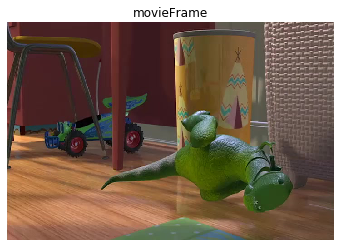

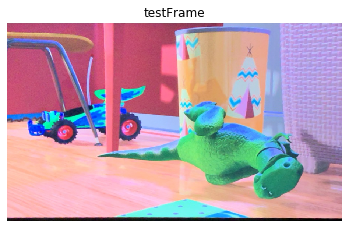

In [8]:
origImagePath = '../../data/movie_titles/testUncompressed/5454-77-146-160/146.jpg'
testImagePath = '../../data/movie_titles/testUncompressed/3D6C53DB-054A-4935-9872-AB2C6093C29F/5.jpg'

oFvs = extractFvFile(origImagePath, interModel)
tFvs = extractFvFile(testImagePath, interModel)
print(tFvs.shape)

res = 100*spatial.distance.cosine(oFvs, tFvs)
print(res)
displayImage(origImagePath, 'movieFrame')
displayImage(testImagePath, 'testFrame')

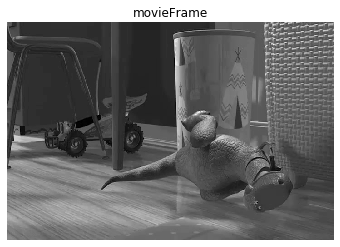

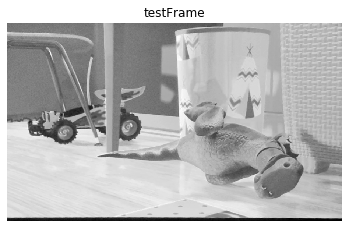

In [22]:
displayGrayImage(origImagePath, 'movieFrame')
displayGrayImage(testImagePath, 'testFrame')

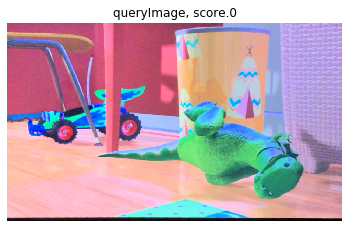

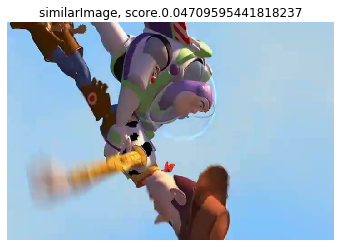

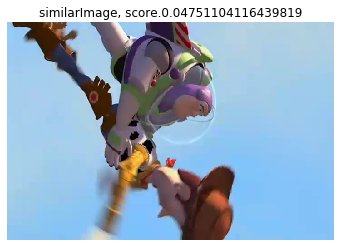

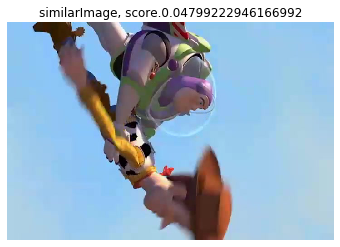

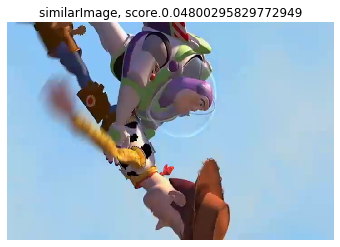

...

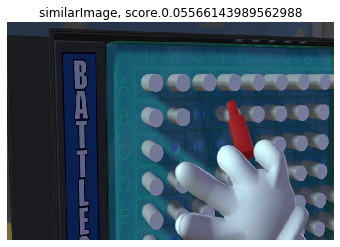

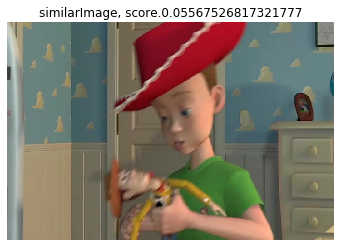

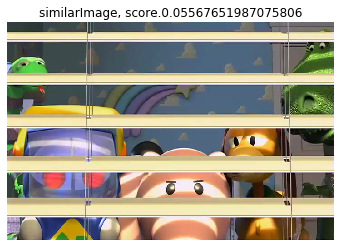

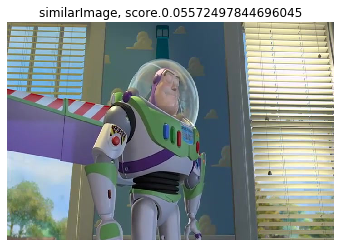

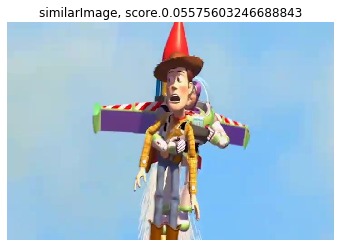

In [14]:
"""
pass a single test image and retrieve similar frames
"""
#testImagePath = '../../data/movie_titles/testUncompressed/5454-77-146-160/146.jpg'
testImagePath = '../../data/movie_titles/testUncompressed/3D6C53DB-054A-4935-9872-AB2C6093C29F/5.jpg'
qFv = extractFvFile(testImagePath, interModel)

resDiffList = []
for srcFv in featureVectors:
    if isAE:
        sfv = np.reshape(srcFv, srcFv.shape[1]*srcFv.shape[2]*srcFv.shape[3])
        res = spatial.distance.cosine(queryFeatureVector, sfv)
    else:
        res = spatial.distance.cosine(qFv, srcFv)
    resDiffList.append(res)
    
#print(sorted(resDiffList))

npResArr = np.array(resDiffList)
origIndexes = np.argsort(npResArr)

score = '0'
displayImage(testImagePath, "queryImage, score.{}".format(score))

count = 0
for ind in origIndexes:
    filePath = fileNames[ind]
    score = resDiffList[ind]
    displayImage(filePath, "similarImage, score.{}".format(score))
    count += 1
    if count > 100:
        break

In [9]:
"""
Randomly pass test image and retrieve similar results
"""
rndInd = np.random.randint(0, 18000)
if isAE:
    fv_size = featureVectors[rndInd].shape[1]*featureVectors[rndInd].shape[2]*featureVectors[rndInd].shape[3]
    queryFeatureVector = np.reshape(featureVectors[rndInd], fv_size)
else:
    queryFeatureVector = featureVectors[rndInd]
    
resDiffList = []
for srcFv in featureVectors:
    if isAE:
        sfv = np.reshape(srcFv, srcFv.shape[1]*srcFv.shape[2]*srcFv.shape[3])
        res = spatial.distance.cosine(queryFeatureVector, sfv)
    else:
        res = spatial.distance.cosine(queryFeatureVector, srcFv)
    resDiffList.append(res)
    
npResArr = np.array(resDiffList)
origIndexes = np.argsort(npResArr)

qFilePath = fileNames[rndInd]
score = resDiffList[rndInd]
display_image(qFilePath, "queryImage, score.{}".format(score))

count = 0
for ind in origIndexes:
    filePath = fileNames[ind]
    score = resDiffList[ind]
    display_image(filePath, "similarImage, score.{}".format(score))
    count += 1
    if count > 100:
        break

ValueError: Input vector should be 1-D.